# 3. Read and inspect Sentinel-1 RTC imagery processed by Microsoft Planetary Computer 

This book will demonstrate how to access radiometrically terrain corrected Sentinel-1 imagery from Microsoft Planetary Computer using `stackstac`. STAC stands for spatio-temporal asset catalog, it is a common framework to describe geospatial information and a way for data providers, developers and users to work and communicate efficiently. You can read more about STAC [here](https://stacspec.org/en) and checkout more useful tutorials for working with STAC data.

## Learning goals

**Xarray and python techniques:** <br>
- Introduction to working with STAC data
- Using `pystac` to query cloud-hosted datasets, observe metadata
- Using `stackstac` to read cloud-hosted data as xarray objects
- Using `xarray` to manipulate and organize Sentinel-1 SAR data
- Performing grouping and reductions on `xarrray` objects
- Visualizing `xarray` objects using `FacetGrid`

**High-level science goals:**<br>
- Querying large cloud-hosted dataset
- Accessing cloud-hosted data stored as COGs (cloud-optimized GeoTIFFs)
- Extracting and organizing metadata

### Other useful resources
These are resources that contain additional examples and discussion of the content in this notebook and more.
- [Xarray user guide](https://docs.xarray.dev/en/stable/user-guide/index.html)
- [How do I...](https://docs.xarray.dev/en/stable/howdoi.html) this is **very** helpful!
- [Xarray High-level computational patterns](https://tutorial.xarray.dev/intermediate/01-high-level-computation-patterns.html) discussion of concepts and associated code examples
- [Parallel computing with dask](https://tutorial.xarray.dev/intermediate/xarray_and_dask.html) Xarray tutorial demonstrating wrapping of dask arrays

In [3]:
%xmode minimal
import xarray as xr
import geopandas as gpd
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import requests
import rich.table
import planetary_computer
from pystac_client import Client
from shapely.geometry import Polygon
import rioxarray as rio
import pystac

import s1_tools

from IPython.display import Image

Exception reporting mode: Minimal


We will use the `pystac_client` package to interact with and query the Microsoft Planetary Computer Sentinel-1 RTC dataset. In the cell below, we will create an object called `catalog` by calling the `.open()` method of the `Client` class. This is establishing a connection with the hosted data at the url provided. Explore the catalog object. You 

## STAC items

In [4]:
catalog = Client.open('https://planetarycomputer.microsoft.com/api/stac/v1')
catalog

<Client id=microsoft-pc>

Now we will define some parameters to help us query the data catalog for the specific collection, time range and geographic area of interest. 
The function `points2coords()` just helps us to format coordinates for areas of interest.

In the cell below we specify the time range we're interested in as well as the geographic area of interest.

In [5]:
time_range = '2021-01-01/2022-08-01'
bbox = [88.214935, 27.92767, 88.302,  28.034]

bbox_coords = s1_tools.points2coords(bbox)
bbox_coords

[(88.214935, 27.92767),
 (88.214935, 28.034),
 (88.302, 28.034),
 (88.302, 27.92767),
 (88.214935, 27.92767)]

Now we will search the catalog for entries that match our criteria for collection (Sentinel-1 RTC), bbox (our AOI) and datetime (our specified time range):

In [6]:
search = catalog.search(collections=["sentinel-1-rtc"], bbox=bbox, datetime=time_range)
items = search.item_collection()
len(items)

143

We've created a few more instances of `pystac_client` classes. Check out the object types below to better familiarize yourself with the pystac package

In [7]:
print(type(catalog))
print(type(search))
print(type(items))

<class 'pystac_client.client.Client'>
<class 'pystac_client.item_search.ItemSearch'>
<class 'pystac.item_collection.ItemCollection'>


You can see that `items` is an instance of the class `ItemCollection`, and we can explore it via the embedded html interface.

In [8]:
items

To make it easier to work with, we can convert  the `items` object to a dictionary, and from there, convert it to a `geopandas.GeoDataFrame`. You can see that the metadata from within each `item` of the `ItemCollection` object is present in the `GeoDataFrame` but its easier to scan and organize this way. 

In [9]:
df = gpd.GeoDataFrame.from_features(items.to_dict(), crs='epsg:4326')
df.head(5)

,geometry,datetime,platform,s1:shape,proj:bbox,proj:shape,end_datetime,constellation,s1:resolution,proj:transform,...,sar:resolution_range,s1:product_timeliness,sar:resolution_azimuth,sar:pixel_spacing_range,sar:observation_direction,sar:pixel_spacing_azimuth,sar:looks_equivalent_number,s1:instrument_configuration_ID,sat:platform_international_designator,proj:code
0,"POLYGON ((86.20612 27.84414, 86.21011 27.78327...",2022-08-01T12:14:14.610123Z,SENTINEL-1A,"[28151, 21598]","[421830.0, 2916240.0, 703340.0, 3132220.0]","[21598, 28151]",2022-08-01 12:14:27.109058+00:00,Sentinel-1,high,"[10.0, 0.0, 421830.0, 0.0, -10.0, 3132220.0, 0...",...,20,Fast-24h,22,10,right,10,4.4,7,2014-016A,EPSG:32645
1,"POLYGON ((89.98012 27.01219, 90.99394 27.17292...",2022-07-27T12:06:06.953202Z,SENTINEL-1A,"[28423, 21970]","[618250.0, 2960450.0, 902480.0, 3180150.0]","[21970, 28423]",2022-07-27 12:06:19.452211+00:00,Sentinel-1,high,"[10.0, 0.0, 618250.0, 0.0, -10.0, 3180150.0, 0...",...,20,Fast-24h,22,10,right,10,4.4,7,2014-016A,EPSG:32645
2,"POLYGON ((89.80442 27.02311, 89.82929 27.27473...",2022-07-23T00:03:32.650978Z,SENTINEL-1A,"[27531, 21084]","[524490.0, 2980820.0, 799800.0, 3191660.0]","[21084, 27531]",2022-07-23 00:03:45.150333+00:00,Sentinel-1,high,"[10.0, 0.0, 524490.0, 0.0, -10.0, 3191660.0, 0...",...,20,Fast-24h,22,10,right,10,4.4,7,2014-016A,EPSG:32645
3,"POLYGON ((86.20591 27.84405, 86.21002 27.78237...",2022-07-20T12:14:13.801000Z,SENTINEL-1A,"[28149, 21598]","[421810.0, 2916230.0, 703300.0, 3132210.0]","[21598, 28149]",2022-07-20 12:14:26.299940+00:00,Sentinel-1,high,"[10.0, 0.0, 421810.0, 0.0, -10.0, 3132210.0, 0...",...,20,Fast-24h,22,10,right,10,4.4,7,2014-016A,EPSG:32645
4,"POLYGON ((89.98022 27.01218, 90.99394 27.17283...",2022-07-15T12:06:06.242032Z,SENTINEL-1A,"[28422, 21971]","[618260.0, 2960440.0, 902480.0, 3180150.0]","[21971, 28422]",2022-07-15 12:06:18.741751+00:00,Sentinel-1,high,"[10.0, 0.0, 618260.0, 0.0, -10.0, 3180150.0, 0...",...,20,Fast-24h,22,10,right,10,4.4,7,2014-016A,EPSG:32645


In [10]:
df.columns

Index(['geometry', 'datetime', 'platform', 's1:shape', 'proj:bbox',
       'proj:shape', 'end_datetime', 'constellation', 's1:resolution',
       'proj:transform', 's1:datatake_id', 'start_datetime', 's1:orbit_source',
       's1:slice_number', 's1:total_slices', 'sar:looks_range',
       'sat:orbit_state', 'sar:product_type', 'sar:looks_azimuth',
       'sar:polarizations', 'sar:frequency_band', 'sat:absolute_orbit',
       'sat:relative_orbit', 's1:processing_level', 'sar:instrument_mode',
       'sar:center_frequency', 'sar:resolution_range', 's1:product_timeliness',
       'sar:resolution_azimuth', 'sar:pixel_spacing_range',
       'sar:observation_direction', 'sar:pixel_spacing_azimuth',
       'sar:looks_equivalent_number', 's1:instrument_configuration_ID',
       'sat:platform_international_designator', 'proj:code'],
      dtype='object')

Now we want to check out a rendered preview of an individual item from the `ItemCollection` object. We do this by calling the `assets` accessor, and supplying the HREF of the rendered preview key.

In [11]:
Image(url=items[0].assets["rendered_preview"].href)

We can construct a table with metadata for a single scene (ie. a single element of the list `items`)

In [12]:
table = rich.table.Table('key','value')
for k,v in sorted(items[0].properties.items()):
    table.add_row(k, str(v))
table

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ key                                   ┃ value                                                       ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│ constellation                         │ Sentinel-1                                                  │
│ datetime                              │ 2022-08-01T12:14:14.610123Z                                 │
│ end_datetime                          │ 2022-08-01 12:14:27.109058+00:00                            │
│ platform                              │ SENTINEL-1A                                                 │
│ proj:bbox                             │ [421830.0, 2916240.0, 703340.0, 3132220.0]                  │
│ proj:code                             │ EPSG:32645                                                  │
│ proj:shape                            │ [21598, 28151]                                              │
│ proj:transform                        │ [10.0, 0.0, 421830.0, 0.0, -10.0, 3132220.0, 0.0, 0.0, 1.0] │
│ s1:datatake_id                        │ 346937                                                      │
│ s1:instrument_configuration_ID        │ 7                                                           │
│ s1:orbit_source                       │ RESORB                                                      │
│ s1:processing_level                   │ 1                                                           │
│ s1:product_timeliness                 │ Fast-24h                                                    │
│ s1:resolution                         │ high                                                        │
│ s1:shape                              │ [28151, 21598]                                              │
│ s1:slice_number                       │ 6                                                           │
│ s1:total_slices                       │ 20                                                          │
│ sar:center_frequency                  │ 5.405                                                       │
│ sar:frequency_band                    │ C                                                           │
│ sar:instrument_mode                   │ IW                                                          │
│ sar:looks_azimuth                     │ 1                                                           │
│ sar:looks_equivalent_number           │ 4.4                                                         │
│ sar:looks_range                       │ 5                                                           │
│ sar:observation_direction             │ right                                                       │
│ sar:pixel_spacing_azimuth             │ 10                                                          │
│ sar:pixel_spacing_range               │ 10                                                          │
│ sar:polarizations                     │ ['VV', 'VH']                                                │
│ sar:product_type                      │ GRD                                                         │
│ sar:resolution_azimuth                │ 22                                                          │
│ sar:resolution_range                  │ 20                                                          │
│ sat:absolute_orbit                    │ 44359                                                       │
│ sat:orbit_state                       │ ascending                                                   │
│ sat:platform_international_designator │ 2014-016A                                                   │
│ sat:relative_orbit                    │ 12                                                          │
│ start_datetime                        │ 2022-08-01 12:14:02.111187+00:00                            │
└───────────────────────────────────────┴───────

We can also explore the object metadata outside of the table. Try typing `.assets`, `.links`, `.STAC_extensions` and `.properties` onto the term below. 
You can query the object programmatically for the same metadata stored in the table using dictionary syntax on the `properties` accessor.

In [13]:
items[0]
#items[0].assets
#items[0].links

<Item id=S1A_IW_GRDH_1SDV_20220801T121402_20220801T121427_044359_054B39_rtc>

In [14]:
items[0].properties

{'datetime': '2022-08-01T12:14:14.610123Z',
 'platform': 'SENTINEL-1A',
 's1:shape': [28151, 21598],
 'proj:bbox': [421830.0, 2916240.0, 703340.0, 3132220.0],
 'proj:shape': [21598, 28151],
 'end_datetime': '2022-08-01 12:14:27.109058+00:00',
 'constellation': 'Sentinel-1',
 's1:resolution': 'high',
 'proj:transform': [10.0, 0.0, 421830.0, 0.0, -10.0, 3132220.0, 0.0, 0.0, 1.0],
 's1:datatake_id': '346937',
 'start_datetime': '2022-08-01 12:14:02.111187+00:00',
 's1:orbit_source': 'RESORB',
 's1:slice_number': '6',
 's1:total_slices': '20',
 'sar:looks_range': 5,
 'sat:orbit_state': 'ascending',
 'sar:product_type': 'GRD',
 'sar:looks_azimuth': 1,
 'sar:polarizations': ['VV', 'VH'],
 'sar:frequency_band': 'C',
 'sat:absolute_orbit': 44359,
 'sat:relative_orbit': 12,
 's1:processing_level': '1',
 'sar:instrument_mode': 'IW',
 'sar:center_frequency': 5.405,
 'sar:resolution_range': 20,
 's1:product_timeliness': 'Fast-24h',
 'sar:resolution_azimuth': 22,
 'sar:pixel_spacing_range': 10,
 's

Now that we'e explored the items that fit our query of the dataset and seen the metadata, let's read the data in using xarray. 

We will now use `dask.distributed` to manage our tasks. Confusingly, we will use the dask.distributed class `Client` to interact with the cluster. 

## Reading data using xarray

In [15]:
from dask.distributed import Client

client = Client(processes=False)
print(client.dashboard_link)

http://192.168.86.116:8787/status


The `client.dashboard_link` points to a dask dashboard for the client we've just instantiated. 

Now that we have queried the data that is available from Microsoft Planetary Computer and inspected the metadata using `pystac`, we will use `stackstac` to read the data into our notebook as an xarray object. Calling `stackstac.stack()` produces a lazy `xarray.DataArray` with dask integration out of a STAC `collection` object. 

In [16]:
type(items)

pystac.item_collection.ItemCollection

In the code cell below, you can see that we pass the object `items`, a `pystac.ItemCollection` to the `stackstac.stack()` method. The wrapper `planetary_computer.sign()` uses Planetary Computer subscription key credentials to access the data. `stackstac` passes the metadata from the STAC collection into the xarray object as coordinates allowing you to further organize and manipulate the object to fit your purposes. `stackstac` can also read the data in according to parameters passed during the `stack()` call. In the code cell below we pass parameters for bounding box and coordinate reference system. To specify the resolution as something other than the resolution at which its stored, pass a `resolution = ` argument. 

In [17]:
import stackstac
import os

da = stackstac.stack(
    planetary_computer.sign(items), bounds_latlon=bbox, epsg=32645
)

In [18]:
da

<xarray.DataArray 'stackstac-3572e7b71c1a77a3e7b8570a86a579dc' (time: 143,
                                                                band: 2,
                                                                y: 1542, x: 888)> Size: 3GB
dask.array<fetch_raster_window, shape=(143, 2, 1542, 888), dtype=float64, chunksize=(1, 1, 1024, 888), chunktype=numpy.ndarray>
Coordinates: (12/39)
  * time                                   (time) datetime64[ns] 1kB 2021-01-...
    id                                     (time) <U66 38kB 'S1A_IW_GRDH_1SDV...
  * band                                   (band) <U2 16B 'vh' 'vv'
  * x                                      (x) float64 7kB 6.194e+05 ... 6.28...
  * y                                      (y) float64 12kB 3.102e+06 ... 3.0...
    s1:processing_level                    <U1 4B '1'
    ...                                     ...
    platform                               <U11 44B 'SENTINEL-1A'
    proj:code                              <U10 40B 'EPSG:32645'
    raster:bands                           object 8B {'nodata': -32768, 'data...
    description                            (band) <U173 1kB 'Terrain-correcte...
    title                                  (band) <U41 328B 'VH: vertical tra...
    epsg                                   int64 8B 32645
Attributes:
    spec:           RasterSpec(epsg=32645, bounds=(619419.5314582244, 3089781...
    crs:            epsg:32645
    transform:      | 9.79, 0.00, 619419.53|\n| 0.00,-7.70, 3101655.25|\n| 0....
    resolution_xy:  (9.788706070864338, 7.699930607059487)

### Retrieve source granule ID

It will be useful to have the granule ID for the original SAR acquisition and GRD file used to generate the RTC image. The following code demonstrates retrieving the source granule ID from the STAC metadata and adding it as a coordinate variable to the xarray object  containing the RTC imagery.

In [19]:
stac_item = pystac.read_file('https://planetarycomputer.microsoft.com/api/stac/v1/collections/sentinel-1-rtc/items/S1A_IW_GRDH_1SDV_20210602T120544_20210602T120609_038161_0480FD_rtc')

In [20]:
def extract_source_granule_pc(rtc_id):
    
    base_url = 'https://planetarycomputer.microsoft.com/api/stac/v1/collections/sentinel-1-rtc/items/'
    full_url = base_url + str(rtc_id)
    stac_item = pystac.read_file(full_url)
    source_granule = stac_item.links[5].target[-62:]
    return source_granule

In [21]:
granule_ls = [extract_source_granule_pc(da.isel(time=t).id.values) for t in range(len(da.time))]

In [22]:
def make_granule_coord_pc(granule_ls):
    '''this fn takes a list of granule IDs, extracts acq date for each granule, organizes this as an array that can be assigned as a coord to an xr obj'''
        
    acq_date = [pd.to_datetime(granule[17:25]) for granule in granule_ls]

    granule_da = xr.DataArray(data = granule_ls, 
                              dims = ['time'],
                              coords = {'time':acq_date},
                             attrs = {'description': 'source granule ID S1 GRD files used to process PC RTC images, extracted from STAC metadata'},
                             name='granule_id')
    
    return granule_da

In [23]:
granule_coord = make_granule_coord_pc(granule_ls)
granule_coord

<xarray.DataArray 'granule_id' (time: 143)> Size: 35kB
array(['S1A_IW_GRDH_1SDV_20210102T121350_20210102T121415_035959_043653',
       'S1A_IW_GRDH_1SDV_20210105T000309_20210105T000334_035995_043787',
       'S1A_IW_GRDH_1SDV_20210109T120543_20210109T120608_036061_0439EE',
       'S1A_IW_GRDH_1SDV_20210114T121350_20210114T121415_036134_043C7E',
       'S1A_IW_GRDH_1SDV_20210117T000308_20210117T000333_036170_043DAD',
       'S1A_IW_GRDH_1SDV_20210121T120542_20210121T120607_036236_044009',
       'S1A_IW_GRDH_1SDV_20210126T121349_20210126T121414_036309_04428F',
       'S1A_IW_GRDH_1SDV_20210129T000308_20210129T000333_036345_0443C6',
       'S1A_IW_GRDH_1SDV_20210202T120542_20210202T120607_036411_044618',
       'S1A_IW_GRDH_1SDV_20210207T121349_20210207T121414_036484_04489D',
       'S1A_IW_GRDH_1SDV_20210210T000307_20210210T000332_036520_0449D9',
       'S1A_IW_GRDH_1SDV_20210214T120541_20210214T120606_036586_044C38',
       'S1A_IW_GRDH_1SDV_20210219T121348_20210219T121413_036659_044EBC',
       'S1A_IW_GRDH_1SDV_20210222T000307_20210222T000332_036695_044FF8',
       'S1A_IW_GRDH_1SDV_20210226T120541_20210226T120606_036761_04524C',
       'S1A_IW_GRDH_1SDV_20210303T121348_20210303T121413_036834_0454C9',
       'S1A_IW_GRDH_1SDV_20210306T000307_20210306T000332_036870_045604',
       'S1A_IW_GRDH_1SDV_20210310T120541_20210310T120606_036936_045868',
       'S1A_IW_GRDH_1SDV_20210315T121348_20210315T121413_037009_045AE4',
       'S1A_IW_GRDH_1SDV_20210318T000307_20210318T000332_037045_045C26',
...
       'S1A_IW_GRDH_1SDV_20220516T120549_20220516T120614_043236_0529DD',
       'S1A_IW_GRDH_1SDV_20220521T121357_20220521T121422_043309_052C00',
       'S1A_IW_GRDH_1SDV_20220528T120550_20220528T120615_043411_052F0A',
       'S1A_IW_GRDH_1SDV_20220602T121358_20220602T121423_043484_053126',
       'S1A_IW_GRDH_1SDV_20220605T000317_20220605T000342_043520_05323C',
       'S1A_IW_GRDH_1SDV_20220609T120551_20220609T120616_043586_053436',
       'S1A_IW_GRDH_1SDV_20220614T121359_20220614T121424_043659_05365F',
       'S1A_IW_GRDH_1SDV_20220617T000317_20220617T000342_043695_053770',
       'S1A_IW_GRDH_1SDV_20220621T120552_20220621T120617_043761_053978',
       'S1A_IW_GRDH_1SDV_20220626T121359_20220626T121424_043834_053BA2',
       'S1A_IW_GRDH_1SDV_20220629T000318_20220629T000343_043870_053CB6',
       'S1A_IW_GRDH_1SDV_20220703T120553_20220703T120618_043936_053EA7',
       'S1A_IW_GRDH_1SDV_20220708T121400_20220708T121425_044009_0540D0',
       'S1A_IW_GRDH_1SDV_20220711T000319_20220711T000344_044045_0541E4',
       'S1A_IW_GRDH_1SDV_20220715T120553_20220715T120618_044111_0543E4',
       'S1A_IW_GRDH_1SDV_20220720T121401_20220720T121426_044184_054615',
       'S1A_IW_GRDH_1SDV_20220723T000320_20220723T000345_044220_05471E',
       'S1A_IW_GRDH_1SDV_20220727T120554_20220727T120619_044286_05491D',
       'S1A_IW_GRDH_1SDV_20220801T121402_20220801T121427_044359_054B39'],
      dtype='<U62')
Coordinates:
  * time     (time) datetime64[ns] 1kB 2021-01-02 2021-01-05 ... 2022-08-01
Attributes:
    description:  source granule ID S1 GRD files used to process PC RTC image...

The `granule_coord` object is a 1-dimensional xarray.DataArray containing the source granule IDs for the original GRD files. The values of the `time` coordinate align with the time coordinate of the data object `pc`, allowing us to use the [`xarray.combine_by_coords()`](https://docs.xarray.dev/en/stable/generated/xarray.combine_by_coords.html) function to merge the two into one object.

First, check the dates between the two coordinates are the same (they should be):

In [24]:
for element in range(len(list(da.time)))[:5]:
    print(list(da.time.values)[element])
    print(list(granule_coord.time.values)[element])
    print('')
print(len(da.time))  
print(len(granule_coord.time))

2021-01-02T12:14:03.114206000
2021-01-02T00:00:00.000000000

2021-01-05T00:03:21.634308000
2021-01-05T00:00:00.000000000

2021-01-09T12:05:55.523867000
2021-01-09T00:00:00.000000000

2021-01-14T12:14:02.556282000
2021-01-14T00:00:00.000000000

2021-01-17T00:03:21.123774000
2021-01-17T00:00:00.000000000

143
143


Now, assign granule id as a **non-dimensional coordinate** of the xarray dataset:

In [25]:
da.coords['granule_id'] = ('time',granule_coord.data)

In [31]:
da = da.compute()

In [32]:
#rename for when we store it to use in the comparison notebook3
#da_pc = da
#da_pc

Great, now we have a data cube of Sentinel-1 RTC backscatter imagery with `x`,`y` and `time` dimensions. Take a look at the coordinates and you can see that there is much more information that we can use to query and filter the dataset. 

Let's do a little bit of looking around. We'll define a function to convert the backscatter pixel values from power to dB scale but we won't use it yet. This transformation applies a logarithmic scale to the data which makes visualization easier but we do not want to run any summary statistics on the dB data as it will be distorted.

What if we only wanted to look at imagery from the `VV` band? 

In [33]:
da_vv = da.sel(band='vv')

We can do the same for `VH`:

In [34]:
da_vh = da.sel(band='vh')

Next, what if we wanted to look only at imagery taken during `ascending` or `descending` passes of the satellite? `band` is a dimensional coordinate, so we could use xarray's `.sel()` method, but orbital direction is a non-dimensional coordinate so we need to approach it a bit differently: 

In [35]:
da_asc = da.where(da['sat:orbit_state'] == 'ascending', drop=True)
da_desc = da.where(da['sat:orbit_state'] == 'descending', drop=True)
da_asc

<xarray.DataArray 'stackstac-3572e7b71c1a77a3e7b8570a86a579dc' (time: 97,
                                                                band: 2,
                                                                y: 1542, x: 888)> Size: 2GB
array([[[[0.01852306, 0.02102464, 0.03679181, ..., 0.02829006,
          0.02407783, 0.01331757],
         [0.01363071, 0.01436052, 0.02640411, ..., 0.02044929,
          0.01942587, 0.01389435],
         [0.01544863, 0.02145823, 0.02126724, ..., 0.01572998,
          0.0121787 , 0.01561528],
         ...,
         [0.13680649, 0.10409892, 0.02661556, ..., 0.03909368,
          0.02282259, 0.05137137],
         [0.16820513, 0.1096866 , 0.08363605, ..., 0.05899434,
          0.03212569, 0.03899859],
         [0.1148144 , 0.09113233, 0.12046846, ..., 0.07310737,
          0.03912293, 0.05235811]],

        [[0.08165378, 0.09103284, 0.08691198, ..., 0.08430599,
          0.10933638, 0.11716778],
         [0.07514741, 0.06696718, 0.05421132, ..., 0.10499008,
          0.10435516, 0.06229627],
         [0.07851957, 0.08709098, 0.08024386, ..., 0.14838947,
          0.11677226, 0.05744437],
...
         [0.05804494, 0.0344152 , 0.03043084, ..., 0.032612  ,
          0.06930031, 0.08976815],
         [0.04141352, 0.03702511, 0.0240678 , ..., 0.04295307,
          0.06010017, 0.07652444],
         [0.03489502, 0.03590686, 0.03265638, ..., 0.04443361,
          0.05298669, 0.04936551]],

        [[0.05228124, 0.0695288 , 0.04747661, ..., 0.10480627,
          0.09374276, 0.10000349],
         [0.06001418, 0.07995154, 0.07430803, ..., 0.07652888,
          0.07526217, 0.07644605],
         [0.05009567, 0.06412159, 0.09555957, ..., 0.04596306,
          0.0513655 , 0.04035843],
         ...,
         [0.20864134, 0.18650939, 0.05160182, ..., 0.95771629,
          0.39059994, 0.38102457],
         [0.15525982, 0.25159886, 0.05475894, ..., 0.60227042,
          0.58171707, 0.29241365],
         [0.10024419, 0.16678235, 0.108464  , ..., 0.38910994,
          0.60438436, 0.11766772]]]])
Coordinates: (12/40)
  * time                                   (time) datetime64[ns] 776B 2021-01...
    id                                     (time) <U66 26kB 'S1A_IW_GRDH_1SDV...
  * band                                   (band) <U2 16B 'vh' 'vv'
  * x                                      (x) float64 7kB 6.194e+05 ... 6.28...
  * y                                      (y) float64 12kB 3.102e+06 ... 3.0...
    s1:processing_level                    <U1 4B '1'
    ...                                     ...
    proj:code                              <U10 40B 'EPSG:32645'
    raster:bands                           object 8B {'nodata': -32768, 'data...
    description                            (band) <U173 1kB 'Terrain-correcte...
    title                                  (band) <U41 328B 'VH: vertical tra...
    epsg                                   int64 8B 32645
    granule_id                             (time) <U62 24kB 'S1A_IW_GRDH_1SDV...
Attributes:
    spec:           RasterSpec(epsg=32645, bounds=(619419.5314582244, 3089781...
    crs:            epsg:32645
    transform:      | 9.79, 0.00, 619419.53|\n| 0.00,-7.70, 3101655.25|\n| 0....
    resolution_xy:  (9.788706070864338, 7.699930607059487)

You can see that there are 69 time steps from the Ascending orbital pass and that all of the same dimensions and coordinates still exist, so you can subset for just the `VV` data from the ascending passes, or other variables you may be interested in.

Let's take a look at the two polarizations side-by-side. Below, we'll plot the `VV` and `VH` polarizations from the same date next to each other:

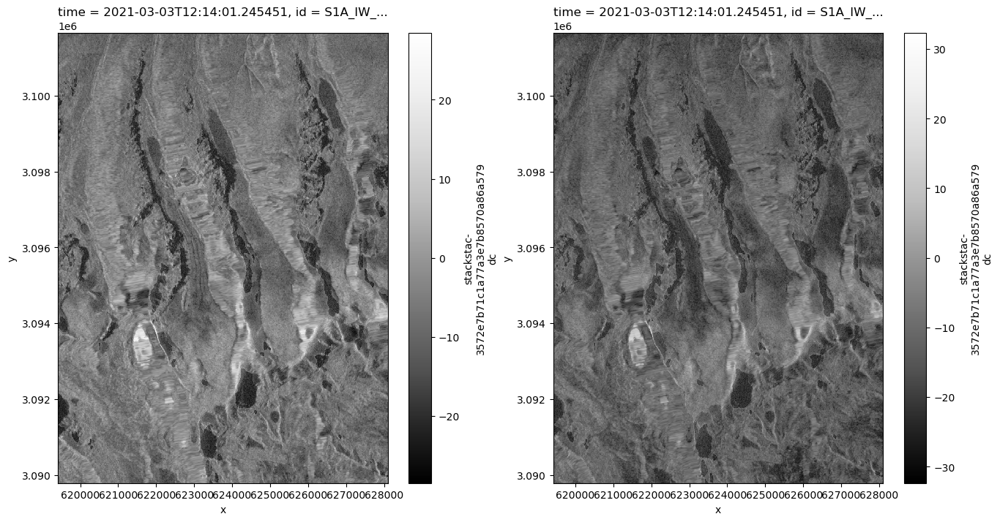

In [36]:
import matplotlib.pyplot as plt 

fig, axs = plt.subplots(ncols=2, figsize=(16,8))
s1_tools.power_to_db(da_asc.sel(band='vv').isel(time=10)).plot(cmap=plt.cm.Greys_r, ax=axs[0]);
s1_tools.power_to_db(da_asc.sel(band='vh').isel(time=10)).plot(cmap=plt.cm.Greys_r, ax=axs[1]);

It looks like there is some interesting variability between the two images. What if we wanted to see how these differences persist over time?

Let's perform a reduction along the `x` and `y` dimensions so that we can get a better idea of this data over time rather than a snapshot:

In [28]:
da_asc.sel(band='vv').mean(dim=['x','y'])

<xarray.DataArray 'stackstac-395b0d071c0ba224e63d6a63821405ff' (time: 97)> Size: 776B
dask.array<mean_agg-aggregate, shape=(97,), dtype=float64, chunksize=(1,), chunktype=numpy.ndarray>
Coordinates: (12/38)
  * time                                   (time) datetime64[ns] 776B 2021-01...
    id                                     (time) <U66 26kB 'S1A_IW_GRDH_1SDV...
    band                                   <U2 8B 'vv'
    proj:code                              <U10 40B 'EPSG:32645'
    sat:absolute_orbit                     (time) int64 776B 35959 ... 44359
    start_datetime                         (time) <U32 12kB '2021-01-02 12:13...
    ...                                     ...
    sar:looks_equivalent_number            float64 8B 4.4
    title                                  <U41 164B 'VV: vertical transmit, ...
    raster:bands                           object 8B {'nodata': -32768, 'data...
    description                            <U173 692B 'Terrain-corrected gamm...
    epsg                                   int64 8B 32645
    granule_id                             (time) <U62 24kB 'S1A_IW_GRDH_1SDV...

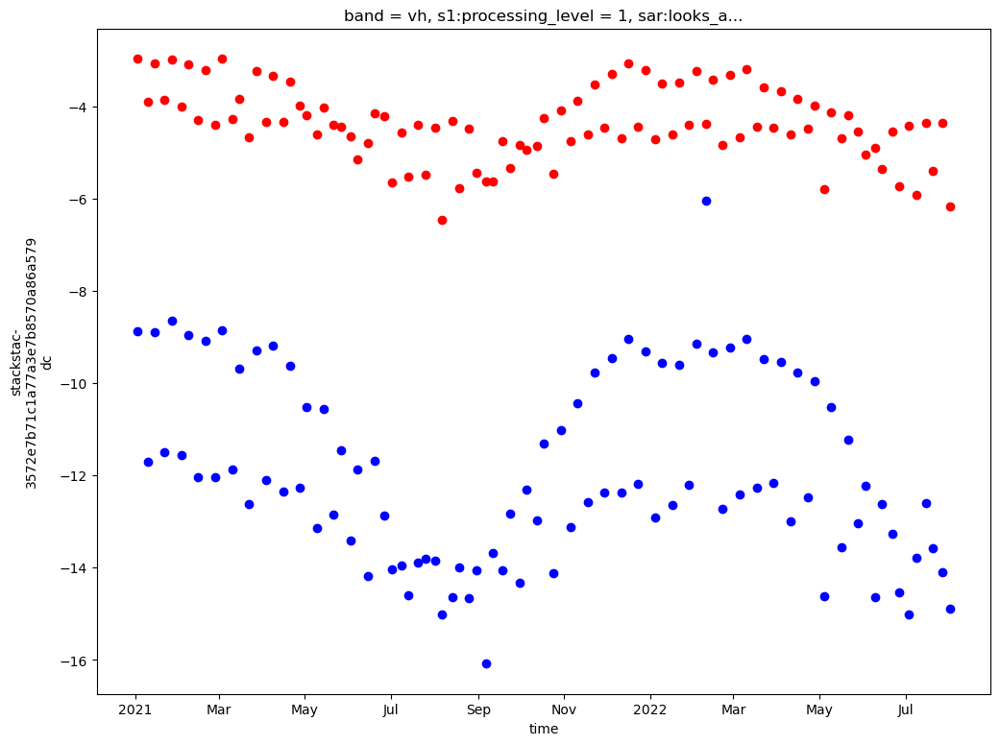

In [37]:
fig, ax = plt.subplots(figsize=(12,9))

ax.set_title('Mean backscatter from ASCENDING passes for VH band (red) and VV band (blue) over time');

s1_tools.power_to_db(da_asc.sel(band='vv').mean(dim=['x','y'])).plot(ax=ax, linestyle='None', marker='o', color='red');
s1_tools.power_to_db(da_asc.sel(band='vh').mean(dim=['x','y'])).plot(ax=ax, linestyle='None', marker='o', color='blue');

Interesting! It looks like there is more variability in the VH band than the VV band. Over the year, there is about 4 dB variability in the VV band but over twice as much in the VH band. Chapter 2 of the [SAR handbook](https://gis1.servirglobal.net/TrainingMaterials/SAR/Chp2Content.pdf) contains information about how polarization impacts radar returns. 
The above plots are looking only at the ascending passes. Let's take a look at all of the time steps (ascending + descending). Any effects based on the different viewing geometries of the ascending and descending passes should have been removed during the radiometric terrain correction step.

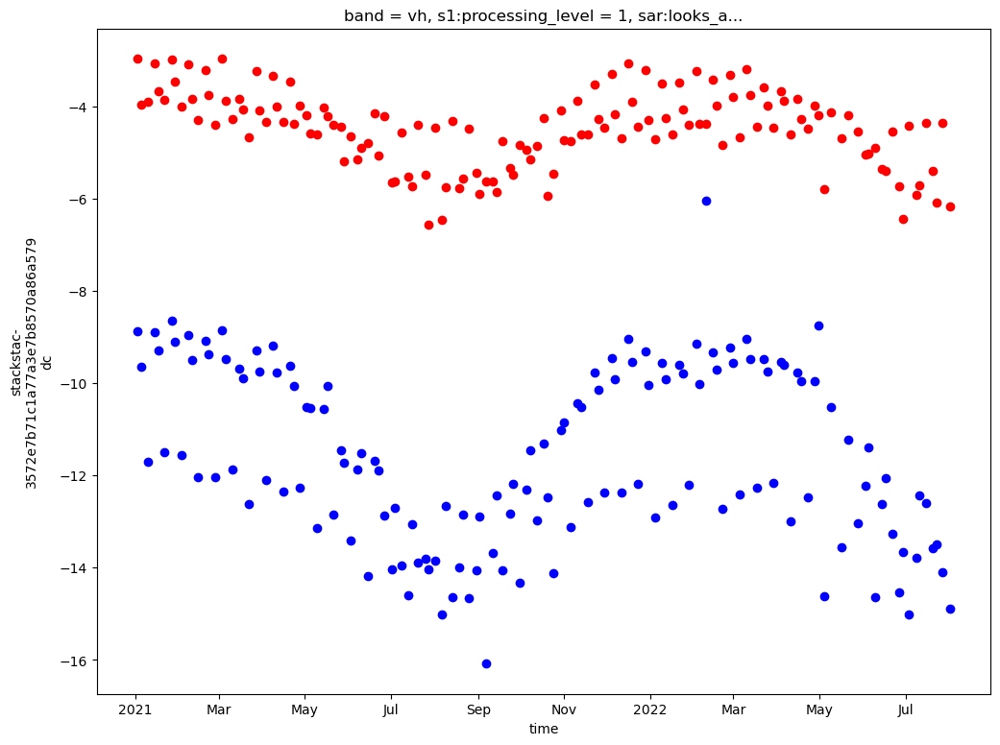

In [38]:
fig, ax = plt.subplots(figsize=(12,9))

ax.set_title('Mean backscatter for VH band (red) and VV band (blue) over time');
s1_tools.power_to_db(da.sel(band='vv').mean(dim=['x','y'])).plot(ax=ax, linestyle='None', marker='o', color='red');
s1_tools.power_to_db(da.sel(band='vh').mean(dim=['x','y'])).plot(ax=ax, linestyle='None', marker='o', color='blue');

Next, let's take a look at how backscatter values vary seasonally. To do this we will use xarray's [groupby()]() and [.facetgrid]() methods.

In [39]:
seasons_gb = da.groupby(da.time.dt.season).mean()
#add the attrs back to the season groupby object
seasons_gb.attrs = da.attrs

In [32]:
seasons_gb

<xarray.DataArray 'stackstac-395b0d071c0ba224e63d6a63821405ff' (season: 4,
                                                                band: 2,
                                                                y: 1542, x: 888)> Size: 88MB
dask.array<stack, shape=(4, 2, 1542, 888), dtype=float64, chunksize=(1, 1, 1024, 888), chunktype=numpy.ndarray>
Coordinates: (12/28)
  * band                                   (band) <U2 16B 'vh' 'vv'
  * x                                      (x) float64 7kB 6.194e+05 ... 6.28...
  * y                                      (y) float64 12kB 3.102e+06 ... 3.0...
    proj:code                              <U10 40B 'EPSG:32645'
    s1:product_timeliness                  <U8 32B 'Fast-24h'
    sar:product_type                       <U3 12B 'GRD'
    ...                                     ...
    sar:looks_equivalent_number            float64 8B 4.4
    title                                  (band) <U41 328B 'VH: vertical tra...
    raster:bands                           object 8B {'nodata': -32768, 'data...
    description                            (band) <U173 1kB 'Terrain-correcte...
    epsg                                   int64 8B 32645
  * season                                 (season) object 32B 'DJF' ... 'SON'
Attributes:
    spec:           RasterSpec(epsg=32645, bounds=(619419.5314582244, 3089781...
    crs:            epsg:32645
    transform:      | 9.79, 0.00, 619419.53|\n| 0.00,-7.70, 3101655.25|\n| 0....
    resolution_xy:  (9.788706070864338, 7.699930607059487)

Use the seasons groupby object and specify the `season` dimension in the `Facetgrid` call to automatically plot mean backscatter for each season:

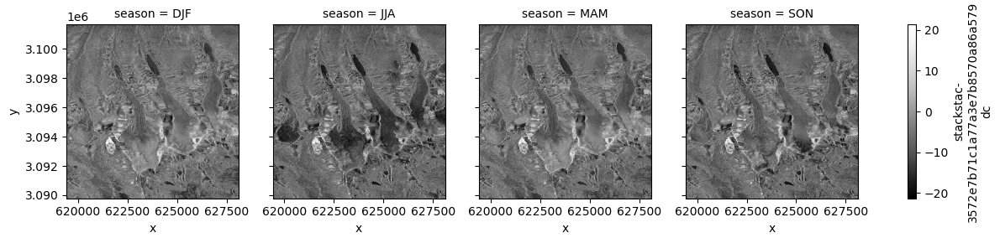

In [40]:
fg_vv = s1_tools.power_to_db(seasons_gb.sel(band='vv')).plot(col='season', cmap=plt.cm.Greys_r);

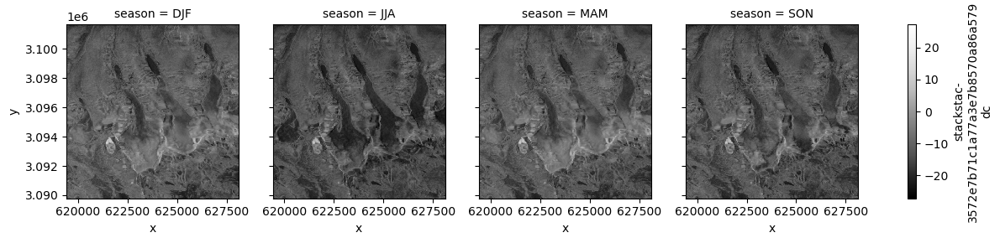

In [41]:
fg_vh = s1_tools.power_to_db(seasons_gb.sel(band='vh')).plot(col='season', cmap=plt.cm.Greys_r);

In [42]:
ds_pc = da.to_dataset(dim='band')

In [43]:
ds_pc = ds_pc.drop_dims('band')

In [44]:
ds_pc = ds_pc.drop('sar:polarizations')

/tmp/ipykernel_1323/3683332.py:1: DeprecationWarning: dropping variables using `drop` is deprecated; use drop_vars.
  ds_pc = ds_pc.drop('sar:polarizations')


Can i avoid writing this to file/storing it? Maybe instead write quick script to create it in next notebooks  ? 

In [45]:
ds_pc = ds_pc.drop('raster:bands')

/tmp/ipykernel_1323/3277813904.py:1: DeprecationWarning: dropping variables using `drop` is deprecated; use drop_vars.
  ds_pc = ds_pc.drop('raster:bands')


In [39]:
ds_pc

<xarray.Dataset> Size: 3GB
Dimensions:                                (time: 143, y: 1542, x: 888)
Coordinates: (12/35)
  * time                                   (time) datetime64[ns] 1kB 2021-01-...
    id                                     (time) <U66 38kB 'S1A_IW_GRDH_1SDV...
  * x                                      (x) float64 7kB 6.194e+05 ... 6.28...
  * y                                      (y) float64 12kB 3.102e+06 ... 3.0...
    proj:code                              <U10 40B 'EPSG:32645'
    sat:absolute_orbit                     (time) int64 1kB 35959 ... 44359
    ...                                     ...
    sar:instrument_mode                    <U2 8B 'IW'
    s1:slice_number                        (time) <U2 1kB '6' '12' ... '6' '6'
    sar:frequency_band                     <U1 4B 'C'
    sar:looks_equivalent_number            float64 8B 4.4
    epsg                                   int64 8B 32645
    granule_id                             (time) <U62 35kB 'S1A_IW_GRDH_1SDV...
Data variables:
    vh                                     (time, y, x) float64 2GB dask.array<chunksize=(1, 1024, 888), meta=np.ndarray>
    vv                                     (time, y, x) float64 2GB dask.array<chunksize=(1, 1024, 888), meta=np.ndarray>
Attributes:
    spec:           RasterSpec(epsg=32645, bounds=(619419.5314582244, 3089781...
    crs:            epsg:32645
    transform:      | 9.79, 0.00, 619419.53|\n| 0.00,-7.70, 3101655.25|\n| 0....
    resolution_xy:  (9.788706070864338, 7.699930607059487)

#ds_pc = ds_pc.compute()

#ds_pc.to_zarr('../data/tutorial2/s1_pc_cube.zarr', mode='w')

## Wrap up

This notebook demonstrated how to access cloud-hosted data from Microsoft Planetary Computer, some basic dataset organization and preliminary exploration and visualization. The following notebook will compare the Planetary Computer dataset to the ASF dataset.